# Logistic Regression for malignancy prediction in cancer

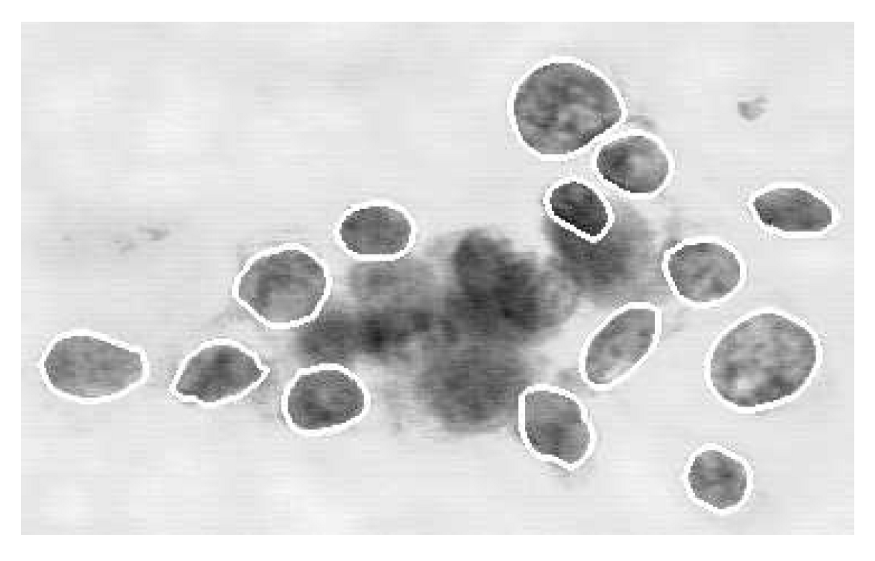


**In this Notebook, I will explain the Logistic Regression, another Supervised Learning model, used for predicting discrete-valued outputs.***

# Import packages

In [1]:
from __future__ import division
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as op

%matplotlib inline

# Uploading data

In [2]:
df = pd.read_csv('data.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
df['Diagnosis'] = pd.get_dummies(df['diagnosis'], drop_first=True)

In [4]:
df['Diagnosis']

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: Diagnosis, Length: 569, dtype: uint8

In [5]:
df.drop('diagnosis', axis=1, inplace=True)

In [6]:
df.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32,Diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN,1
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN,1
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN,1
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN,1
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN,1


# Data Visualization 

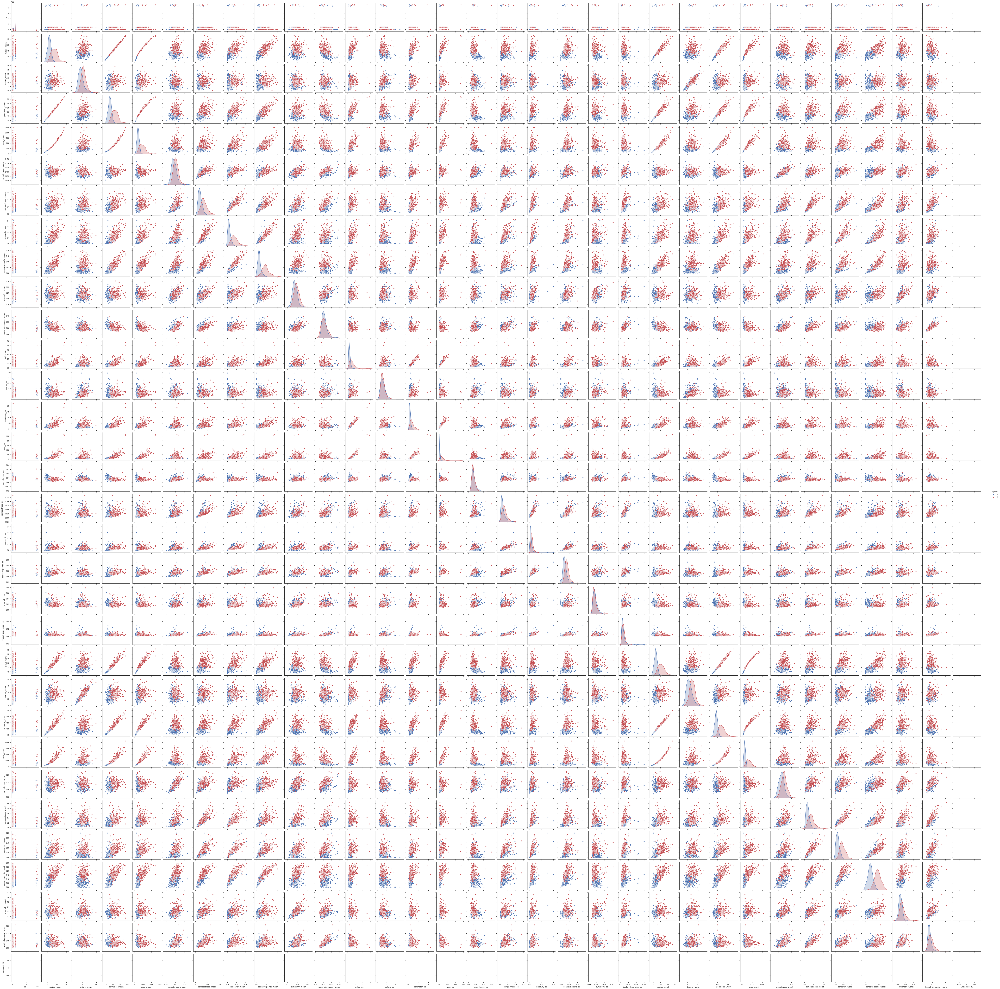

In [7]:
sns.set(style='ticks', color_codes=True)
g = sns.pairplot(df, palette=('b','r'), hue='Diagnosis', height=2.5)
plt.show()

# Bivariate Analysis

In [8]:
def features_correlation_matrix(df):
    from matplotlib import pyplot as plt
    from matplotlib import cm as cm
    fig = plt.figure()
    fig.set_size_inches(18.5, 10.5)
    ax1 = fig.add_subplot(111)
    
    cmap = cm.get_cmap('jet', 100)
    
    cax = ax1.imshow(df.corr().abs(), interpolation='nearest', cmap=cmap)
    
    ax1.grid(True)
    plt.title('Correlation Matrix of the WBCD features', fontsize=20)
    labels=list(df.columns)
    
    ax1.set_xticks(np.arange(len(labels)))
    ax1.set_yticks(np.arange(len(labels)))
    
    ax1.set_xticklabels(labels, fontsize=15, horizontalalignment='left', rotation='vertical')
    ax1.set_yticklabels(labels, fontsize=15)
    
    fig.colorbar(cax, ticks=[-1.0, -0.8, -0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    plt.show()

In [9]:
df_features = df.drop(df.columns[-2], axis=1)

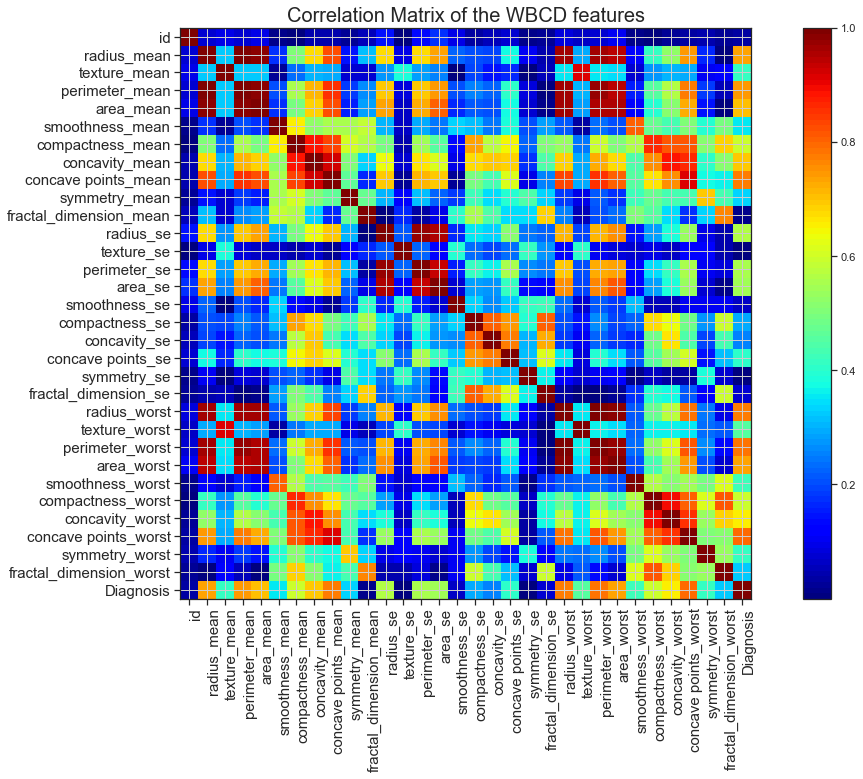

In [10]:
features_correlation_matrix(df_features)

In [11]:
corr_matrix = df_features.corr().abs()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

In [12]:
to_drop

['perimeter_mean',
 'area_mean',
 'concave points_mean',
 'perimeter_se',
 'area_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'concave points_worst']

In [13]:
df_features_corr_dropped = df_features.drop(df_features[to_drop], axis = 1)

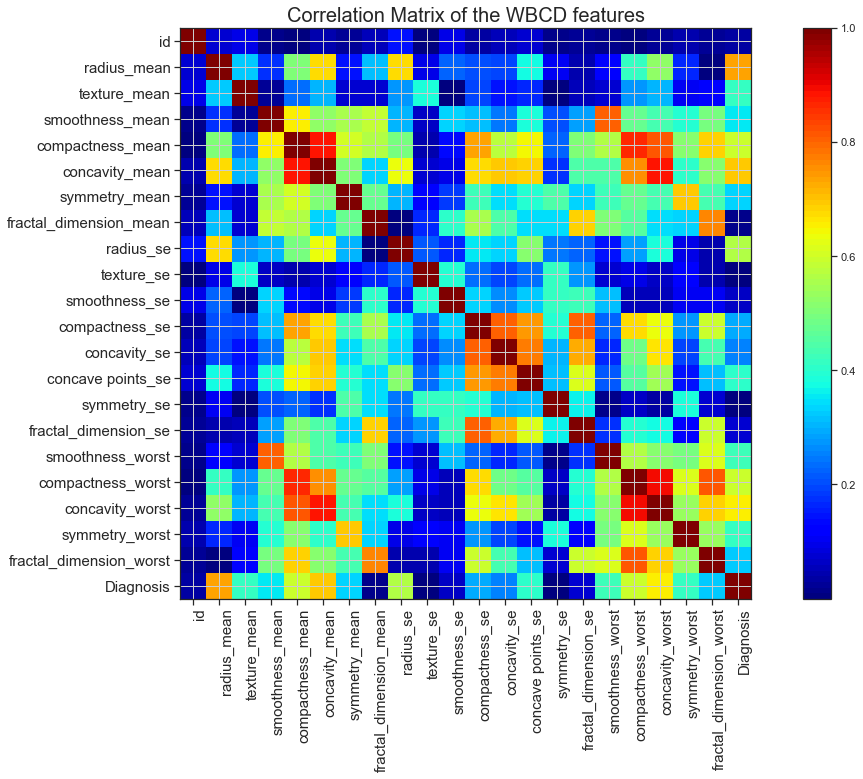

In [14]:
features_correlation_matrix(df_features_corr_dropped)

In [15]:
df_features_corr_dropped.corr().abs()

,id,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,...,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,Diagnosis
id,1.000000,0.074626,0.099770,0.012968,0.000096,0.050080,0.022114,0.052511,0.143048,0.007526,...,0.055239,0.078768,0.017306,0.025725,0.010338,0.002968,0.023203,0.044224,0.029866,0.039769
radius_mean,0.074626,1.000000,0.323782,0.170581,0.506124,0.676764,0.147741,0.311631,0.679090,0.097317,...,0.194204,0.376169,0.104321,0.042641,0.119616,0.413463,0.526911,0.163953,0.007066,0.730029
texture_mean,0.099770,0.323782,1.000000,0.023389,0.236702,0.302418,0.071401,0.076437,0.275869,0.386358,...,0.143293,0.163851,0.009127,0.054458,0.077503,0.277830,0.301025,0.105008,0.119205,0.415185
smoothness_mean,0.012968,0.170581,0.023389,1.000000,0.659123,0.521984,0.557775,0.584792,0.301467,0.068406,...,0.248396,0.380676,0.200774,0.283607,0.805324,0.472468,0.434926,0.394309,0.499316,0.358560
compactness_mean,0.000096,0.506124,0.236702,0.659123,1.000000,0.883121,0.602641,0.565369,0.497473,0.046205,...,0.570517,0.642262,0.229977,0.507318,0.565541,0.865809,0.816275,0.510223,0.687382,0.596534
concavity_mean,0.050080,0.676764,0.302418,0.521984,0.883121,1.000000,0.500667,0.336783,0.631925,0.076218,...,0.691270,0.683260,0.178009,0.449301,0.448822,0.754968,0.884103,0.409464,0.514930,0.696360
symmetry_mean,0.022114,0.147741,0.071401,0.557775,0.602641,0.500667,1.000000,0.479921,0.303379,0.128053,...,0.342627,0.393298,0.449137,0.331786,0.426675,0.473200,0.433721,0.699826,0.438413,0.330499
fractal_dimension_mean,0.052511,0.311631,0.076437,0.584792,0.565369,0.336783,0.479921,1.000000,0.000111,0.164174,...,0.446630,0.341198,0.345007,0.688132,0.504942,0.458798,0.346234,0.334019,0.767297,0.012838
radius_se,0.143048,0.679090,0.275869,0.301467,0.497473,0.631925,0.303379,0.000111,1.000000,0.213247,...,0.332358,0.513346,0.240567,0.227754,0.141919,0.287103,0.380585,0.094543,0.049559,0.567134
texture_se,0.007526,0.097317,0.386358,0.068406,0.046205,0.076218,0.128053,0.164174,0.213247,1.000000,...,0.194998,0.230283,0.411621,0.279723,0.073658,0.092439,0.068956,0.128215,0.045655,0.008303


# Logistic Regression Hypothesis Model

In [16]:
def sigmoid(z):
    return 1/(1+np.exp(-z))

## The Cost Function

In [17]:
def calcCostFunction(theta, X, y):
    m,n = X.shape
    h = X.dot(theta)
    
    J = -(np.sum(y * np.log(sigmoid(h)) + (1-y) * np.log(1 - sigmoid(h)))/m)
    
    return J

## The Gradient Function and its optimization

In [18]:
def calcGradient(theta, X, y):
    m,n = X.shape
    h = X.dot(theta)
    error = sigmoid(h) - y
    
    gradient = 1/m * (X.T).dot(error)
    
    return gradient

# Feature Scaling and Normalization

In [19]:
def FeatureScalingNormalization(X):
    X_norm = X
    
    mu = np.zeros(X.shape[1])
    sigma = np.zeros(X.shape[1])
    
    mu = np.vstack((X[0].mean(), X[1].mean()))
    sigma = np.vstack((X[0].std(ddof=1), X[1].std(ddof=1)))
    
    m = X.shape[1]
    
    mu_matrix = np.multiply(np.ones(m), mu).T
    sigma_matrix = np.multiply(np.ones(m), sigma).T
    
    X_norm = np.subtract(X, mu).T
    X_norm = X_norm/sigma.T
    
    return [X_norm, mu, sigma]

# Calculate the accuracy

In [20]:
def CalcAccuracy(theta, X):
    p = sigmoid(X.dot(theta)) >= 0.5
    return p

In [21]:
df.columns

Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32',
       'Diagnosis'],
      dtype='object')

# Implementing the Logistic Regression with two variables

In [22]:
X = np.vstack((np.asarray(df.radius_mean.values), np.asarray(df.texture_mean.values)))
y = np.asarray(df.Diagnosis.values)

Text(0, 0.5, 'texture_mean')

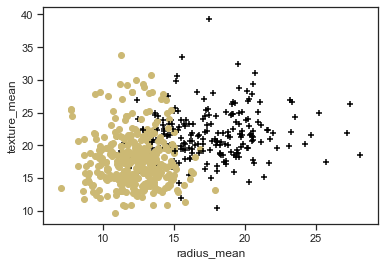

In [23]:
for i in range(len(y)):
    if y[i] == 0.0:
        c = 'y'
        m = u'o'
    if y[i] == 1.0:
        c = 'black'
        m = u'+'
        
    plt.scatter(X[0][i], X[1][i], color=c, marker=m)
    
    
plt.xlabel(df.columns[df.columns.get_loc('radius_mean')])
plt.ylabel(df.columns[df.columns.get_loc('texture_mean')])

In [24]:
# Normalize X using the FeatureScalingNormalization function

featuresNormalizeresults = FeatureScalingNormalization(X)

X = np.asarray(featuresNormalizeresults[0]).T

mu = featuresNormalizeresults[1]

sigma = featuresNormalizeresults[2]

In [25]:
m = len(y) 

n = len(X)

X = np.vstack((np.ones(m), X)).T

# First test: Compute cost and gradient, 
# and display the updated theta starting with initial theta = [0, 0, 0]

In [26]:
initial_theta = np.zeros(n+1); # set theta = [0, 0, 0]

print ("J", calcCostFunction(theta=initial_theta, X=X, y=y))
print ("grad", calcGradient(theta=initial_theta, X=X, y=y))

J 0.6931471805599453
grad [ 0.12741652 -0.35265304 -0.20056252]


# Second test: Compute cost and gradient, 
# and display the updated theta starting with a non-zero theta

In [27]:
test_theta = [-24, 1.2, 0.2];

print ("J", calcCostFunction(theta=test_theta, X=X, y=y))
print ("grad", calcGradient(theta=test_theta, X=X, y=y))

J 8.4787073665132
grad [-0.37258348 -0.35265304 -0.20056252]


# Plot the data with the 
# Logistic Regression Decision Boundary

Text(0, 0.5, 'texture_mean')

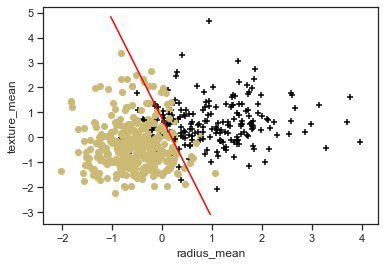

In [29]:
plot_x = np.asarray([X.T[1].min()+1, X.T[1].max()-3])

plot_y = (-1/theta[2]) * (theta[1] * plot_x + theta[0])

for i in range(len(y)):
    if y[i]==0.0:
        c = 'y'
        m = u'o'
    if y[i]==1.0:
        c = 'black'
        m = u'+'
    plt.scatter(X.T[1][i], X.T[2][i], color=c, marker=m) 
    
plt.plot(plot_x, plot_y, color='red')

plt.xlabel(df.columns[df.columns.get_loc("radius_mean")])
plt.ylabel(df.columns[df.columns.get_loc("texture_mean")])

In [30]:
# Calculate accuracy
p = CalcAccuracy(theta, X)
p = (p == y) * 100
print ("Train Accuracy:", p.mean())

Train Accuracy: 89.103690685413


# Perform a Query:
# Predict the risk of malignancy for Radius = 18.00 and Texture = 10.12

### Make a prediction

In [31]:
query = np.asarray([1, 18.00, 10.12])

# Scale and Normalize the query
query_Normalized = \
np.asarray([1, ((query[1]-float(mu[0]))/float(sigma[0])),\
                               ((query[2]-float(mu[1]))/float(sigma[1]))])


prediction = sigmoid(query_Normalized.dot(theta));
prediction

0.7999520268226942

# How to adapt the code for Multiple Variables

In [32]:
def FeatureScalingNormalizationMultipleVariables(X):
    
    X_norm = X 

    mu = np.zeros(X.shape[1]) 
    
    sigma = np.zeros(X.shape[1]) 

    mu = np.vstack((X[0].mean(), \
                    X[1].mean(), \
                    X[2].mean()))
    # The Standard Deviation calculation with NumPy,
    # requires the argument "degrees of freedom" = 1
    sigma = np.vstack((X[0].std(ddof=1),\
                       X[1].std(ddof=1),\
                       X[2].std(ddof=1)))     

    
    m = X.shape[1] 
    
    mu_matrix = np.multiply(np.ones(m), mu).T 
       
    sigma_matrix = np.multiply(np.ones(m), sigma).T
    
    X_norm = np.subtract(X, mu).T
    X_norm = X_norm /sigma.T
    
    return [X_norm, mu, sigma]

In [33]:
df.columns

Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32',
       'Diagnosis'],
      dtype='object')

In [37]:
# Read data from file 'wsbc.data.csv' 
# Make a pandas DataFrame "df" 
# containing the wdbc data.
df = pd.read_csv("data.csv") 
df['Diagnosis'] = pd.get_dummies(df['diagnosis'], drop_first=True)
df.drop('diagnosis', axis=1, inplace=True)
# Make the X and y numpy arrays 
# N.B.: update this code for multiple variables
X = np.vstack((np.asarray(df.radius_mean.values),
               np.asarray(df.texture_mean.values),
               np.asarray(df['concave points_worst'].values)))

y = np.asarray(df.Diagnosis.values)

# Normalize X using the FeatureScalingNormalizationMultipleVariables function, and 
# copy the results in the "featuresNormalizeresults" list
featuresNormalizeresults = FeatureScalingNormalizationMultipleVariables(X)

# get the normalized X matrix
X = np.asarray(featuresNormalizeresults[0]).T

# get the mean
mu = featuresNormalizeresults[1]

# get the sigma
sigma = featuresNormalizeresults[2]

# number of training examples
m = len(y) 

# number of features
n = len(X)

# Add a column of ones to the array/matrix X ad add a column of '1's
X = np.vstack((np.ones(m), X)).T

# Gradient Descent Advanced Optimization: Update and find the optimal theta
m , n = X.shape;
initial_theta = np.zeros(n);


# Perform a Query:
query = np.asarray([1, 5.00, 1.10, 0.4])

# Scale and Normalize the query
query_Normalized = np.asarray([1, ((query[1]-float(mu[0]))/float(sigma[0])),
                               ((query[2]-float(mu[1]))/float(sigma[1])),
                               ((query[3]-float(mu[2]))/float(sigma[2]))])

# Calculate the prediction using the Logistic Function
prediction = sigmoid(query_Normalized.dot(theta));

# Calculate accuracy
p = CalcAccuracy(theta, X)
p = (p == y) * 100

# Print the output
print("Your Query is: "+str(query.tolist()[1:])[1:-1])
print("Train Accuracy: "+str(p.mean()))
print("Prediction: "+str(prediction))

Your Query is: 5.0, 1.1, 0.4
Train Accuracy: 95.43057996485061
Prediction: 0.8154762110038789


# The END!